# Guillaume Payeur (260929164)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import warnings
from scipy import interpolate
%matplotlib inline
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 200
plt.rcParams.update({"text.usetex": True})
%config InlineBackend.figure_format = 'retina'
import sys, platform, os
import matplotlib
from matplotlib import pyplot as plt
import numpy as np
import time
import corner

In [2]:
camb_path = os.path.realpath(os.path.join(os.getcwd(),'..'))
sys.path.insert(0,camb_path)
import camb
from camb import model, initialpower
print('Using CAMB %s installed at %s'%(camb.__version__,os.path.dirname(camb.__file__)))

Using CAMB 1.3.6 installed at C:\Users\Guill\Anaconda3\envs\comp_phys\lib\site-packages\camb


# Q1

I begin by running the test script

In [3]:
def get_spectrum(pars,lmax=3000):
    #print('pars are ',pars)
    H0=pars[0]
    ombh2=pars[1]
    omch2=pars[2]
    tau=pars[3]
    As=pars[4]
    ns=pars[5]
    pars=camb.CAMBparams()
    pars.set_cosmology(H0=H0,ombh2=ombh2,omch2=omch2,mnu=0.06,omk=0,tau=tau)
    pars.InitPower.set_params(As=As,ns=ns,r=0)
    pars.set_for_lmax(lmax,lens_potential_accuracy=0)
    results=camb.get_results(pars)
    powers=results.get_cmb_power_spectra(pars,CMB_unit='muK')
    cmb=powers['total']
    tt=cmb[:,0]    #you could return the full power spectrum here if you wanted to do say EE
    return tt[2:]

chisq is  15267.937150261656  for  2501  degrees of freedom.


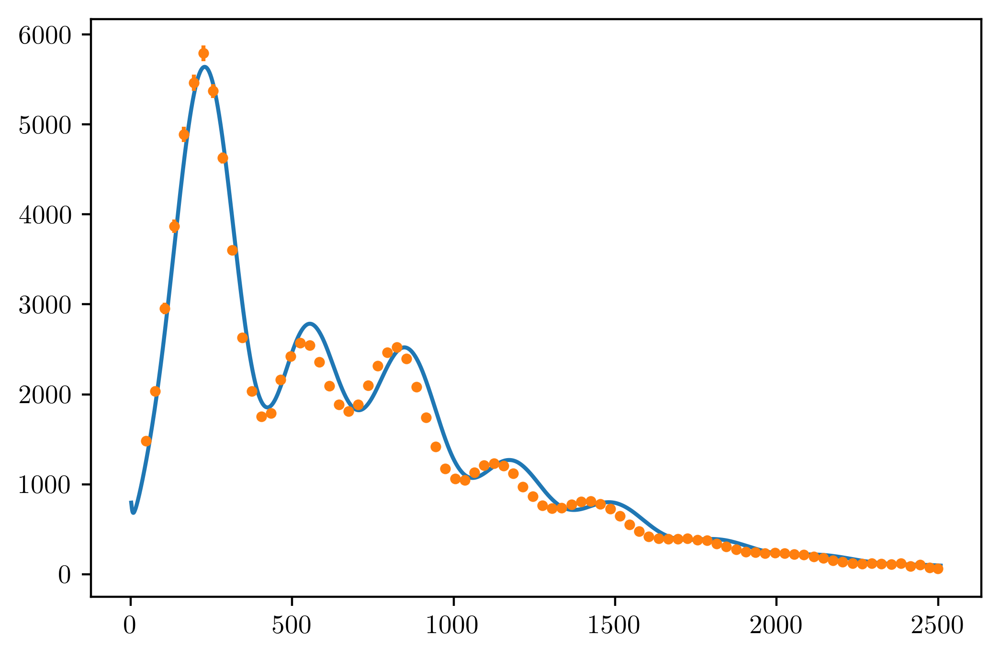

In [4]:
pars=np.asarray([60,0.02,0.1,0.05,2.00e-9,1.0])
planck=np.loadtxt('COM_PowerSpect_CMB-TT-full_R3.01.txt',skiprows=1)
ell=planck[:,0]
spec=planck[:,1]
errs=0.5*(planck[:,2]+planck[:,3]);
model=get_spectrum(pars)
model=model[:len(spec)]
resid=spec-model
chisq=np.sum( (resid/errs)**2)
print("chisq is ",chisq," for ",len(resid)-len(pars)," degrees of freedom.")
#read in a binned version of the Planck PS for plotting purposes
planck_binned=np.loadtxt('COM_PowerSpect_CMB-TT-binned_R3.01.txt',skiprows=1)
errs_binned=0.5*(planck_binned[:,2]+planck_binned[:,3]);
plt.clf()
plt.plot(ell,model)
plt.errorbar(planck_binned[:,0],planck_binned[:,1],errs_binned,fmt='.')
plt.show()

The $\chi^2$ is 15267 which is much more than $\sqrt{2n}$, where $n$ is the number of DOF, meaning the fit is not acceptable.

Now I run the code again with parameters equal to [69,0.022,0.12,0.06,2.1e-9,0.95]

chisq is  3272.2053559202204  for  2501  degrees of freedom.


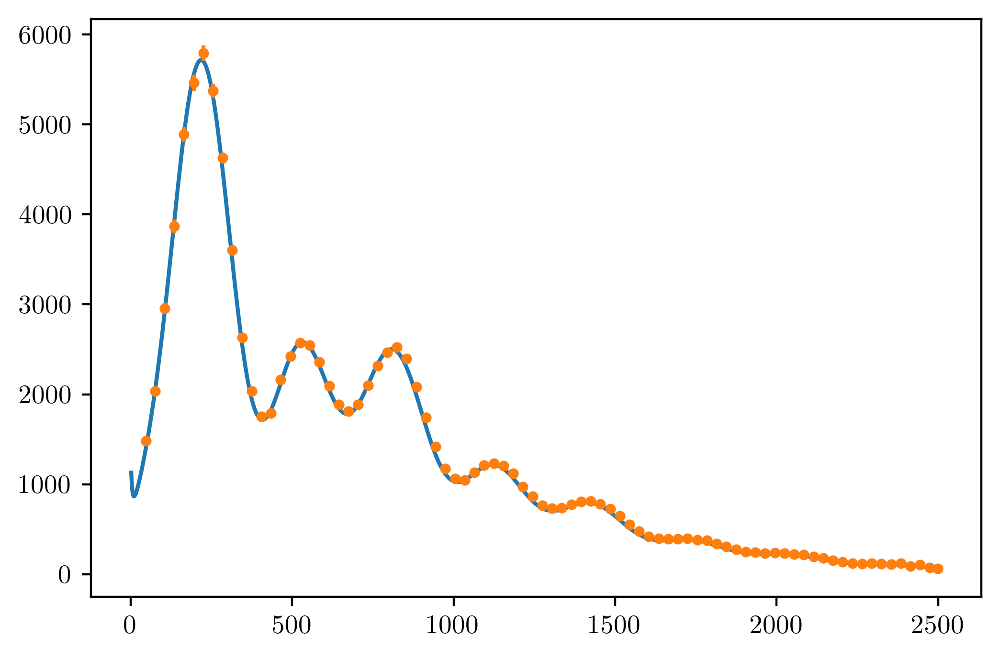

In [5]:
pars=np.asarray([69,0.022,0.12,0.06,2.1e-9,0.95])
planck=np.loadtxt('COM_PowerSpect_CMB-TT-full_R3.01.txt',skiprows=1)
ell=planck[:,0]
spec=planck[:,1]
errs=0.5*(planck[:,2]+planck[:,3]);
model=get_spectrum(pars)
model=model[:len(spec)]
resid=spec-model
chisq=np.sum( (resid/errs)**2)
print("chisq is ",chisq," for ",len(resid)-len(pars)," degrees of freedom.")
#read in a binned version of the Planck PS for plotting purposes
planck_binned=np.loadtxt('COM_PowerSpect_CMB-TT-binned_R3.01.txt',skiprows=1)
errs_binned=0.5*(planck_binned[:,2]+planck_binned[:,3]);
plt.clf()
plt.plot(ell,model)
plt.errorbar(planck_binned[:,0],planck_binned[:,1],errs_binned,fmt='.')
plt.show()

The $\chi^2$ is 3272 which is within on standard deviation ($\sqrt{2n}$) of the mean ($n$) of the $\chi^2$ distribution, meaning the fit is acceptable.

# Q2

Now we use Newton's method to find the least squares parameters. To avoid the high condition number matrix complexities, for each itteration of Newton's method I do one step where $A_s$ is frozen, and one step where everything except $A_s$ is frozen. In both of the substeps, the matrix that needs to be inverted no longer has a high condition number. Doing this still allows finding the minimum of $\chi^2$ in this case, perhaps with a few extra steps.

In [6]:
from scipy.misc import derivative

def ndiff(fun,x):
    delta = 1e-8    
    # Calculating derivative
    f1 = 1/(2*delta)*(fun(x+delta)-fun(x-delta))
    return f1

# Initial guess for parameters
m=np.asarray([69,0.022,0.12,0.06,2.1e-9,0.95])

# Doing itterations of Newton's method
planck=np.loadtxt('COM_PowerSpect_CMB-TT-full_R3.01.txt',skiprows=1)
ell=planck[:,0]
spec=planck[:,1]
for i in range(20):
    # Computing residuals
    errs=0.5*(planck[:,2]+planck[:,3]);
    model=get_spectrum(m)
    model=model[:len(spec)]
    resid=spec-model

    # Computing gradient of A numerically
    def fun_H0(H0):
        pars = np.concatenate((np.array([H0]),m[1:6]))
        model=get_spectrum(pars)[:len(spec)]
        return model
    A_H0 = ndiff(fun_H0,m[0])
    
    def fun_Omega_b(Omega_b):
        pars = np.concatenate((m[0:1],np.array([Omega_b]),m[2:6]))
        model=get_spectrum(pars)[:len(spec)]
        return model
    A_Omega_b = ndiff(fun_Omega_b,m[1])
    
    def fun_Omega_c(Omega_c):
        pars = np.concatenate((m[0:2],np.array([Omega_c]),m[3:6]))
        model=get_spectrum(pars)[:len(spec)]
        return model
    A_Omega_c = ndiff(fun_Omega_c,m[2])

    def fun_tau(tau):
        pars = np.concatenate((m[0:3],np.array([tau]),m[4:6]))
        model=get_spectrum(pars)[:len(spec)]
        return model
    A_tau = ndiff(fun_tau,m[3])
    
    def fun_A_s(A_s):
        pars = np.concatenate((m[0:4],np.array([A_s]),m[5:6]))
        model=get_spectrum(pars)[:len(spec)]
        return model
    A_A_s = ndiff(fun_A_s,m[4])
    
    def fun_n_s(n_s):
        pars = np.concatenate((m[0:5],np.array([n_s])))
        model=get_spectrum(pars)[:len(spec)]
        return model
    A_n_s = ndiff(fun_n_s,m[5])
      
    A_m = np.zeros((model.shape[0],6))
    A_m[:,0] = A_H0
    A_m[:,1] = A_Omega_b
    A_m[:,2] = A_Omega_c
    A_m[:,3] = A_tau
    A_m[:,4] = A_A_s*0
    A_m[:,5] = A_n_s
               
    # Computing delta m
    delta_m = np.linalg.pinv(A_m.T@A_m)@A_m.T@resid
    m = m + delta_m
    
    A_m = np.zeros((model.shape[0],6))
    A_m[:,0] = A_H0
    A_m[:,1] = A_Omega_b
    A_m[:,2] = A_Omega_c
    A_m[:,3] = A_tau
    A_m[:,4] = A_A_s
    A_m[:,5] = A_n_s
               
    # Computing delta m
    delta_m = np.linalg.pinv(A_m.T@A_m)@A_m.T@resid
    m = m + delta_m
    
# Printing best fit parameters
print(m)

[6.91869339e+01 2.25841221e-02 1.15510664e-01 6.31117495e-02
 2.09786376e-09 9.76674996e-01]


Plotting the model and the data to make sure the parameters are good

chisq is  2604.0900096853675  for  2501  degrees of freedom.


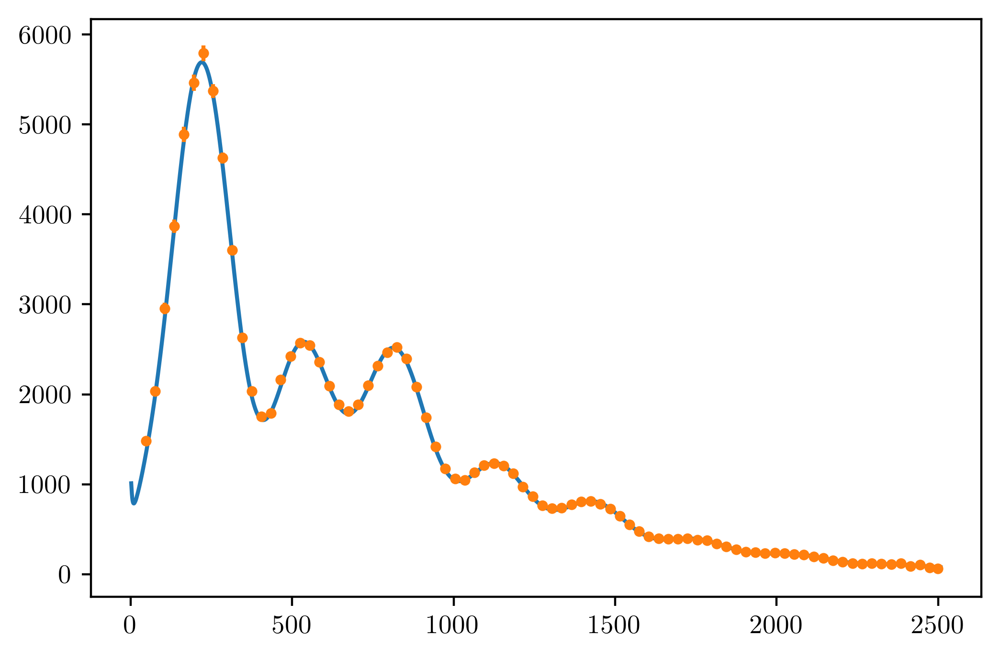

In [7]:
pars=m
planck=np.loadtxt('COM_PowerSpect_CMB-TT-full_R3.01.txt',skiprows=1)
ell=planck[:,0]
spec=planck[:,1]
errs=0.5*(planck[:,2]+planck[:,3]);
model=get_spectrum(pars)
model=model[:len(spec)]
resid=spec-model
chisq=np.sum( (resid/errs)**2)
print("chisq is ",chisq," for ",len(resid)-len(pars)," degrees of freedom.")
#read in a binned version of the Planck PS for plotting purposes
planck_binned=np.loadtxt('COM_PowerSpect_CMB-TT-binned_R3.01.txt',skiprows=1)
errs_binned=0.5*(planck_binned[:,2]+planck_binned[:,3]);
plt.clf()
plt.plot(ell,model)
plt.errorbar(planck_binned[:,0],planck_binned[:,1],errs_binned,fmt='.')
plt.show()

Now we approximate the uncertainty on the fit parameters. We use the known errors on each data point of the power spectrum, and assume that all data points are uncorrelated.

In [8]:
# Calculating covariance matrix of parameters
Ninv = np.eye(errs.shape[0])*(1/errs**2)
cov = np.linalg.inv(A_m.T@Ninv@A_m)
    
# Printing uncertainty on best fit parameters
e_m = np.sqrt(np.diag(cov))
print(e_m)

[4.62593320e-01 1.97522537e-04 7.75875139e-04 2.02948351e-02
 8.55608200e-11 3.14237898e-03]


So the parameters and uncertainties we got via Newton's method are
\begin{align}
    H_0 &= (6.92\pm0.05)\text{x}10^1\\
    \Omega_bh^2 &=(2.26\pm0.02)\text{x}10^{-2}\\
    \Omega_ch^2 &=(1.155\pm0.008)\text{x}10^{-1}\\ 
    \tau &= (6\pm2)\text{x}10^{-2}\\
    A_s &= (2.10\pm0.09)\text{x}10^{-9}\\
    n_s &= (9.77\pm0.03)\text{x}10^{-1}
\end{align}
Now we just save it all to a file.

In [9]:
with open('planck_fit_params.txt', 'w') as f:
    f.write('Quantity       Best fit value         uncertainty\n')
    f.write('H0             {}      {}\n'.format(m[0],e_m[0]))
    f.write('Omega_bh^2     {}      {}\n'.format(m[1],e_m[1]))
    f.write('Omega_ch^2     {}      {}\n'.format(m[2],e_m[2]))
    f.write('tau            {}      {}\n'.format(m[3],e_m[3]))
    f.write('A_s            {}      {}\n'.format(m[4],e_m[4]))
    f.write('n_s            {}      {}\n'.format(m[5],e_m[5]))

# Q3

Now we use an MCMC to estimate the parameters and uncertainties. I will use the covariance matrix on the 6 parameters obtained using Newton's method to determine the step size. 

In [10]:
# Function to calculate chi2 of a set of parameters 
# given CMB observation
def chi2(pars,x,y,errs):
    model=get_spectrum(pars)
    model=model[:len(spec)]
    resid=y-model
    chisq=np.sum((resid/errs)**2)
    return chisq

# Function to make an MCMC chain
def mcmc(pars,cov,x,y,fun,noise,nstep=1000):
    # Initial chi2
    chi_cur=fun(pars,x,y,noise)
    # Making array to hold chains and chi2
    npar=pars.shape[0]
    chain=np.zeros([nstep,npar])
    chivec=np.zeros(nstep)

    for i in range(nstep):
        print(i)
        
        L = np.linalg.cholesky(cov)
        n = L@np.random.randn(6)    
        trial_pars=pars+n
        trial_chisq=fun(trial_pars,x,y,noise)
        delta_chisq=trial_chisq-chi_cur
        accept_prob=np.exp(-0.5*delta_chisq)
        accept=np.random.rand(1)<accept_prob
        if accept:
            pars=trial_pars
            chi_cur=trial_chisq
        chain[i,:]=pars
        chivec[i]=chi_cur
    return chain,chivec

In [ ]:
# Running the MCMC chain
pars = m
cov = cov
x = planck[:,0]
y = planck[:,1]
fun = chi2
noise = 0.5*(planck[:,2]+planck[:,3])

chain,chivec = mcmc(pars,cov,x,y,fun,noise,nstep=35000)

# Saving the MCMC chain
np.save('chains/planck_chain.npy',chain)
with open('planck_chain.txt', 'w') as f:
    f.write('chi2                  H0                  Omega_bh^2           Omega_ch^2          tau                   A_s                  n_s\n')
    for i in range(chain.shape[0]):
        f.write('{} {} {} {} {} {}\n'.format(chivec[i],chain[i,0],chain[i,1],chain[i,2],chain[i,3],chain[i,4],chain[i,5]))

Now I make plots of the chain to see that it converged properly.

In [12]:
chain = np.load('chains/planck_chain.npy')

Text(0, 0.5, '$H_0$')

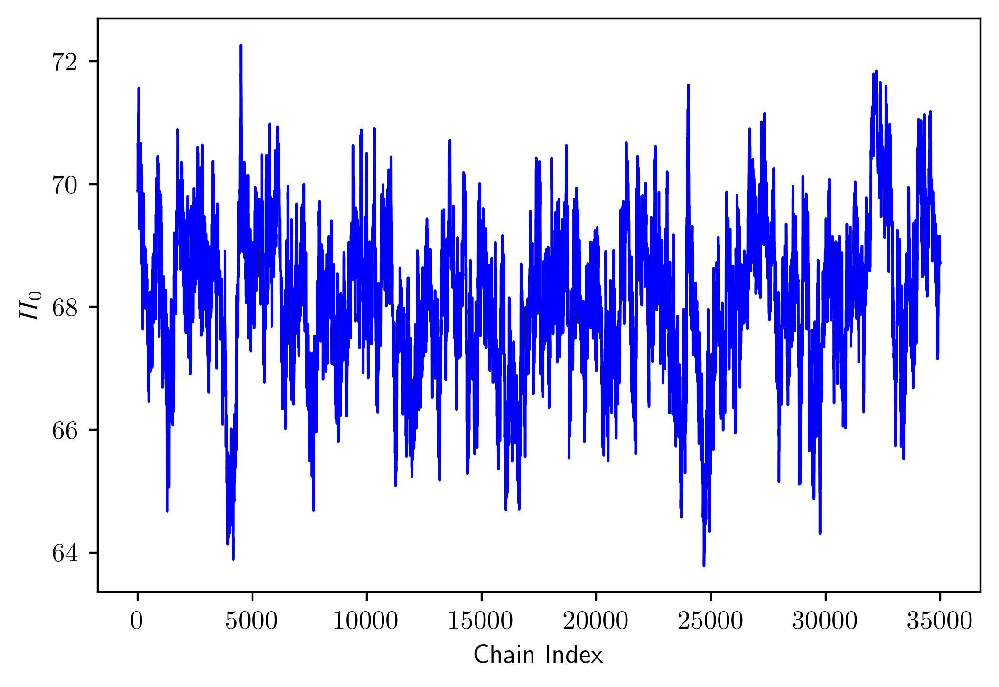

In [13]:
plt.plot(chain[:,0],color='blue',lw=1)
plt.xlabel('Chain Index')
plt.ylabel('$H_0$')

Text(0, 0.5, '$\\Omega_b h^2$')

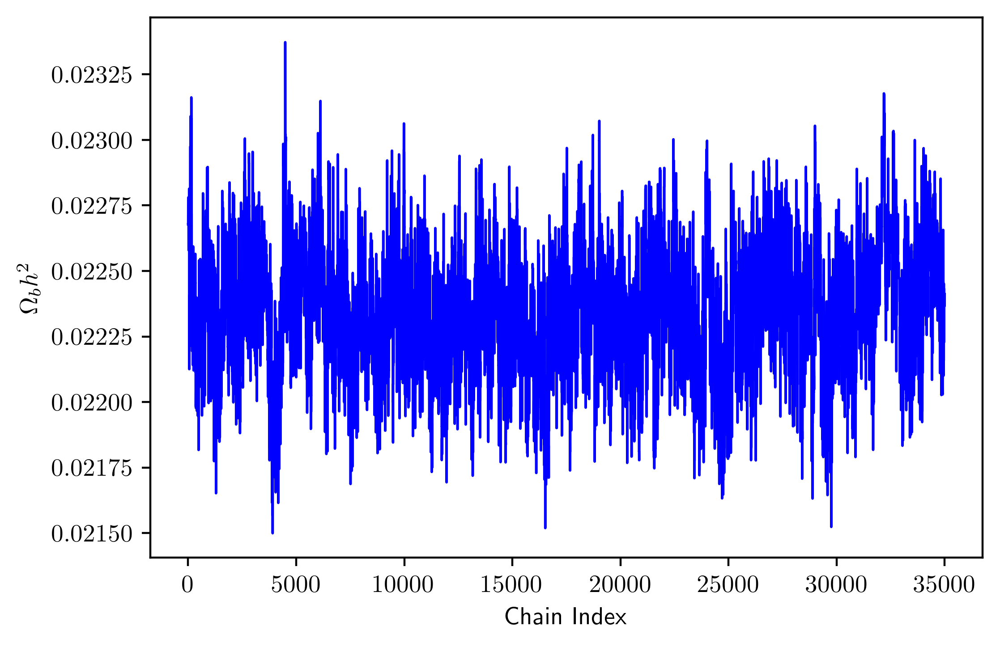

In [14]:
plt.plot(chain[:,1],color='blue',lw=1)
plt.xlabel('Chain Index')
plt.ylabel('$\Omega_b h^2$')

Text(0, 0.5, '$\\Omega_c h^2$')

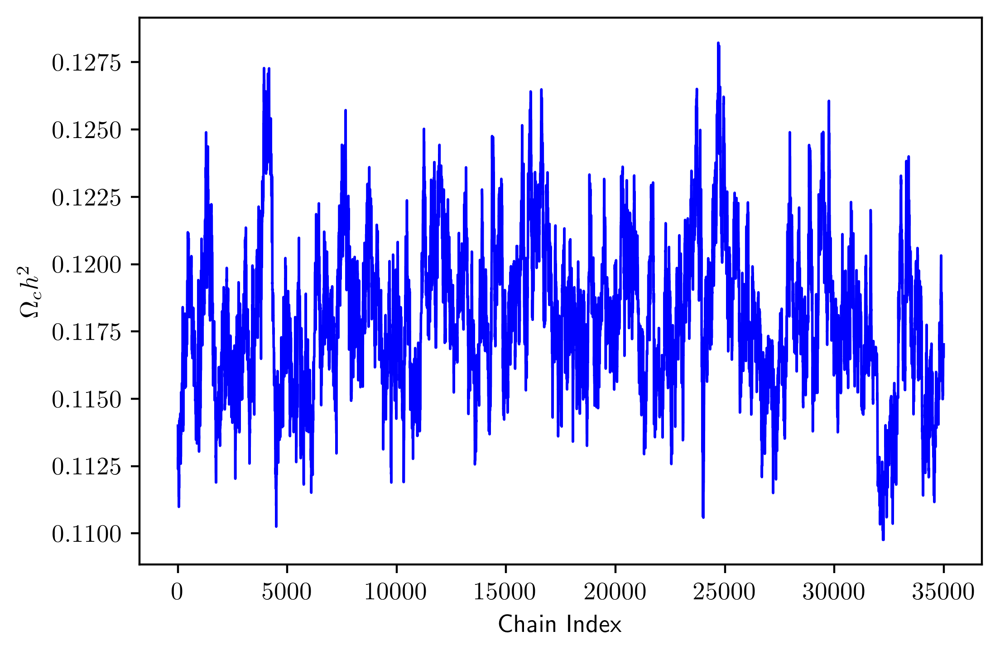

In [15]:
plt.plot(chain[:,2],color='blue',lw=1)
plt.xlabel('Chain Index')
plt.ylabel('$\Omega_c h^2$')

Text(0, 0.5, '$\\tau$')

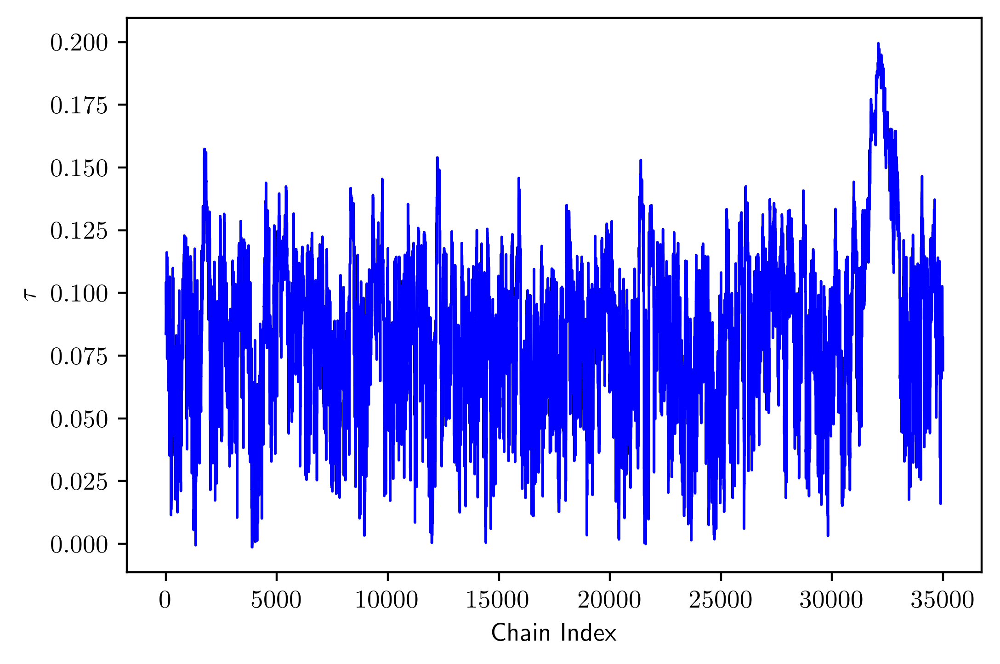

In [16]:
plt.plot(chain[:,3],color='blue',lw=1)
plt.xlabel('Chain Index')
plt.ylabel('$\\tau$')

Text(0, 0.5, '$A_s$')

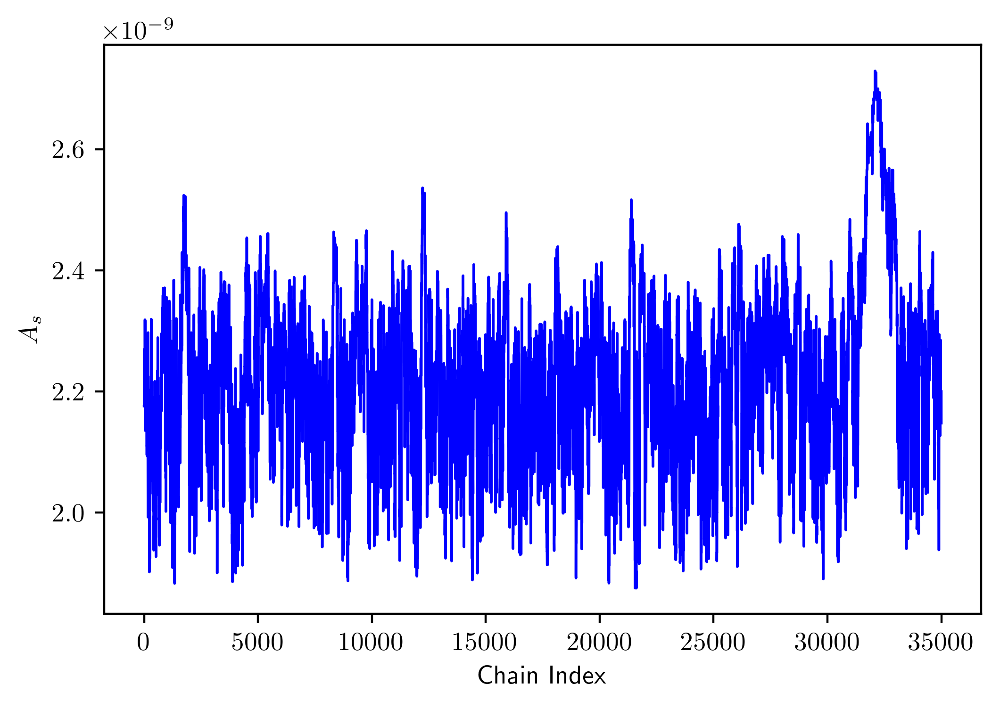

In [17]:
plt.plot(chain[:,4],color='blue',lw=1)
plt.xlabel('Chain Index')
plt.ylabel('$A_s$')

Text(0, 0.5, '$n_s$')

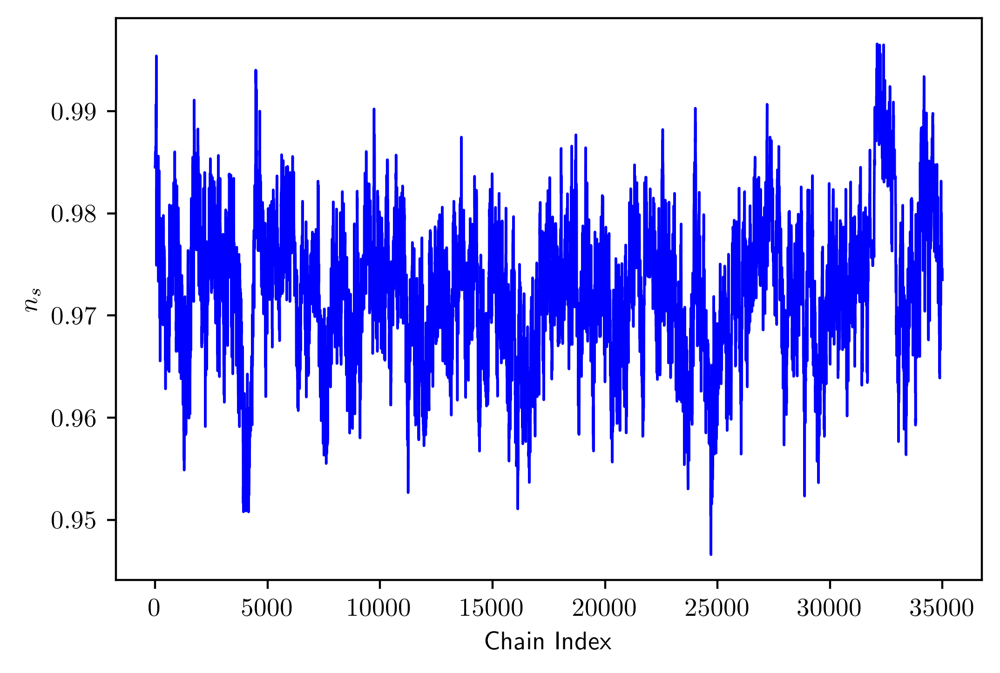

In [18]:
plt.plot(chain[:,5],color='blue',lw=1)
plt.xlabel('Chain Index')
plt.ylabel('$n_s$')

I'll also make a corner plot with the parameter densities

<Figure size 1200x800 with 0 Axes>

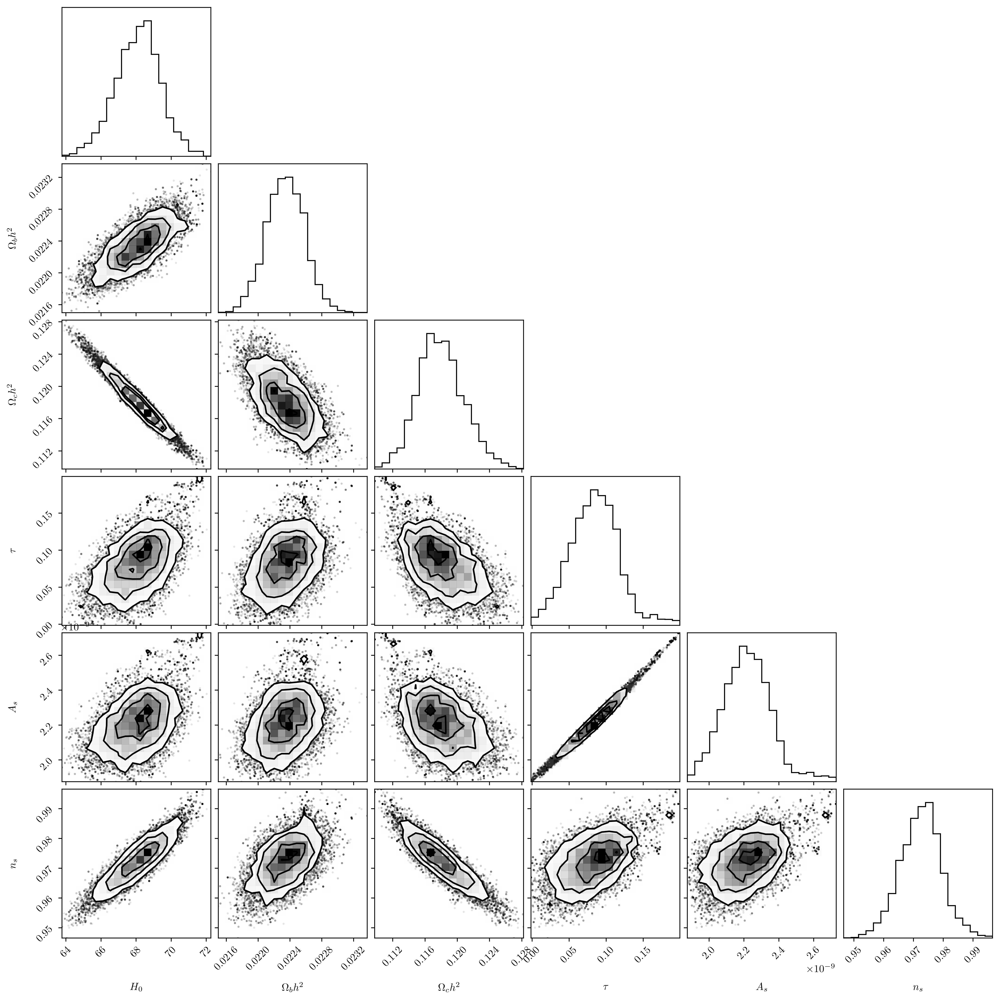

In [19]:
plt.clf()
fig = corner.corner(chain,color='black',
             labels=['$H_0$',
                     '$\Omega_b h^2$',
                     '$\Omega_c h^2$',
                     '$\\tau$',
                     '$A_s$',
                     '$n_s$'])

Now we calculate the parameters and uncertainties using the chain.

In [20]:
H_0 = np.mean(chain[:,0])
e_H_0 = np.std(chain[:,0])
print(H_0,e_H_0)

Omega_b = np.mean(chain[:,1])
e_Omega_b = np.std(chain[:,1])
print(Omega_b,e_Omega_b)

Omega_c = np.mean(chain[:,2])
e_Omega_c = np.std(chain[:,2])
print(Omega_c,e_Omega_c)

tau = np.mean(chain[:,3])
e_tau = np.std(chain[:,3])
print(tau,e_tau)

A_s = np.mean(chain[:,4])
e_A_s = np.std(chain[:,4])
print(A_s,e_A_s)

n_s = np.mean(chain[:,5])
e_n_s = np.std(chain[:,5])
print(n_s,e_n_s)

68.10475237642378 1.275533525197749
0.022345509800301783 0.00023890735468051085
0.11801761879327277 0.0028685729032340433
0.08428141295795616 0.03313313133700802
2.220291329929201e-09 1.3952627279973812e-10
0.9725498704557731 0.00692442489012692


So the parameters and uncertainties we got are
\begin{align}
    H_0 &= (68.1\pm0.1)\text{x}10^1\\
    \Omega_bh^2 &=(2.23\pm0.03)\text{x}10^{-2}\\
    \Omega_ch^2 &=(1.12\pm0.03)\text{x}10^{-1}\\ 
    \tau &= (8\pm3)\text{x}10^{-2}\\
    A_s &= (2.2\pm0.1)\text{x}10^{-9}\\
    n_s &= (9.73\pm0.07)\text{x}10^{-1}
\end{align}
We can see with the plots that the chains have converged fairly well. The reason is that there is (little) structure to the chain on the scale of the entire chain. But clearly it could also be better. Given more time I'd rerun the chain a second time while setting the step size using the results of this first chain.

Now we calculate the energy density of dark energy

In [21]:
Omega_lambda = 1 - Omega_b/((H_0/100)**2) - Omega_c/((H_0/100)**2)
e_Omega_lambda = (e_Omega_b/Omega_b+2*e_H_0/H_0)*(Omega_b/((H_0/100)**2)) + (e_Omega_c/Omega_c+2*e_H_0/H_0)*(Omega_c/((H_0/100)**2))

print(Omega_lambda,e_Omega_lambda)

0.6973795983527343 0.0180352236187603


So are MCMC gives that the energy density of Dark Energy is
\begin{align}
    \Omega_{\Lambda} = 0.70 \pm 0.02
\end{align}

# Q4

First we do importance sampling. It corresponds to adding weights to each element of the MCMC chain. The weights are given by the likelihood of tau under the constraint given for tau:
\begin{align}
    w = \mathrm{exp}\Big(\frac{-1}{2}\Big(\frac{\tau-0.0540}{0.0074}\Big)^2\Big)
\end{align}
In this way each element of the chain gets a weight according to it's value of $\tau$. To do the importance sampling we recompute the means and the covariance matrix, just adding the weights as part of the calculation.

In [22]:
# Generating weights vector
weights = np.exp((-1/2)*((chain[:,3]-0.0540)/0.0074)**2)

In [23]:
# Calculating weighted covariance matrix
cov = np.cov(m=chain,rowvar=0,aweights=weights)

# Calculating weighted mean and standard error on each parameter
H_0 = np.average(chain[:,0],weights=weights)
e_H_0 = np.sqrt(cov[0,0])
print(H_0,e_H_0)

Omega_b = np.average(chain[:,1],weights=weights)
e_Omega_b = np.sqrt(cov[1,1])
print(Omega_b,e_Omega_b)

Omega_c = np.average(chain[:,2],weights=weights)
e_Omega_c = np.sqrt(cov[2,2])
print(Omega_c,e_Omega_c)

tau = np.average(chain[:,3],weights=weights)
e_tau = np.sqrt(cov[3,3])
print(tau,e_tau)

A_s = np.average(chain[:,4],weights=weights)
e_A_s = np.sqrt(cov[4,4])
print(A_s,e_A_s)

n_s = np.average(chain[:,5],weights=weights)
e_n_s = np.sqrt(cov[5,5])
print(n_s,e_n_s)

67.4617187250192 1.1526630265354674
0.022256855604905722 0.00022507345919121278
0.11944487538198832 0.0026623835380323404
0.05538682293453518 0.007266133328586856
2.099624096862069e-09 3.16545481043856e-11
0.9691044771299575 0.006084568643445815


So the parameters we get from importance sampling are
\begin{align}
    H_0 &= (67\pm1)\text{x}10^1\\
    \Omega_bh^2 &=(2.22\pm0.02)\text{x}10^{-2}\\
    \Omega_ch^2 &=(1.12\pm0.02)\text{x}10^{-1}\\ 
    \tau &= (5.5\pm0.7)\text{x}10^{-2}\\
    A_s &= (2.10\pm0.03)\text{x}10^{-9}\\
    n_s &= (9.69\pm0.06)\text{x}10^{-1}
\end{align}
Now we use the covariance matrix we obtained and re-run an MCMC chain, with the step size determined by the covariance matrix. As for the $\chi^2$, we update it by noting that $\chi^2_{\text{new}}$ = $(\chi^2_{\text{old}})(\chi^2_{\tau})$

In [24]:
# Function to calculate chi2 of a set of parameters 
# given CMB observation
def chi2_polarization(pars,x,y,errs):
    model=get_spectrum(pars)
    model=model[:len(spec)]
    resid=y-model
    chisq=np.sum((resid/errs)**2)
    chisq = chisq+((pars[3]-0.0540)/0.0074)**2
    return chisq

# Function to make an MCMC chain
def mcmc(pars,cov,x,y,fun,noise,nstep=1000):
    # Initial chi2
    chi_cur=fun(pars,x,y,noise)
    # Making array to hold chains and chi2
    npar=pars.shape[0]
    chain=np.zeros([nstep,npar])
    chivec=np.zeros(nstep)

    for i in range(nstep):
        print(i)
        
        L = np.linalg.cholesky(cov)
        n = L@np.random.randn(6)    
        trial_pars=pars+n
        trial_chisq=fun(trial_pars,x,y,noise)
        delta_chisq=trial_chisq-chi_cur
        accept_prob=np.exp(-0.5*delta_chisq)
        accept=np.random.rand(1)<accept_prob
        if accept:
            pars=trial_pars
            chi_cur=trial_chisq
        chain[i,:]=pars
        chivec[i]=chi_cur
    return chain,chivec

In [ ]:
# Running the MCMC
pars = m
x = planck[:,0]
y = planck[:,1]
fun = chi2_polarization
noise = 0.5*(planck[:,2]+planck[:,3])

chain,chivec = mcmc(pars,cov,x,y,fun,noise,nstep=35000)

# Saving the chain
np.save('chains/planck_chain_tauprior.npy',chain)
with open('planck_chain_tauprior.txt', 'w') as f:
    f.write('chi2                  H0                  Omega_bh^2           Omega_ch^2          tau                   A_s                  n_s\n')
    for i in range(chain.shape[0]):
        f.write('{} {} {} {} {} {}\n'.format(chivec[i],chain[i,0],chain[i,1],chain[i,2],chain[i,3],chain[i,4],chain[i,5]))

Now I make plots of the chain to see that it converged properly

In [36]:
chain = np.load('chains/planck_chain_tauprior.npy')

Text(0, 0.5, '$H_0$')

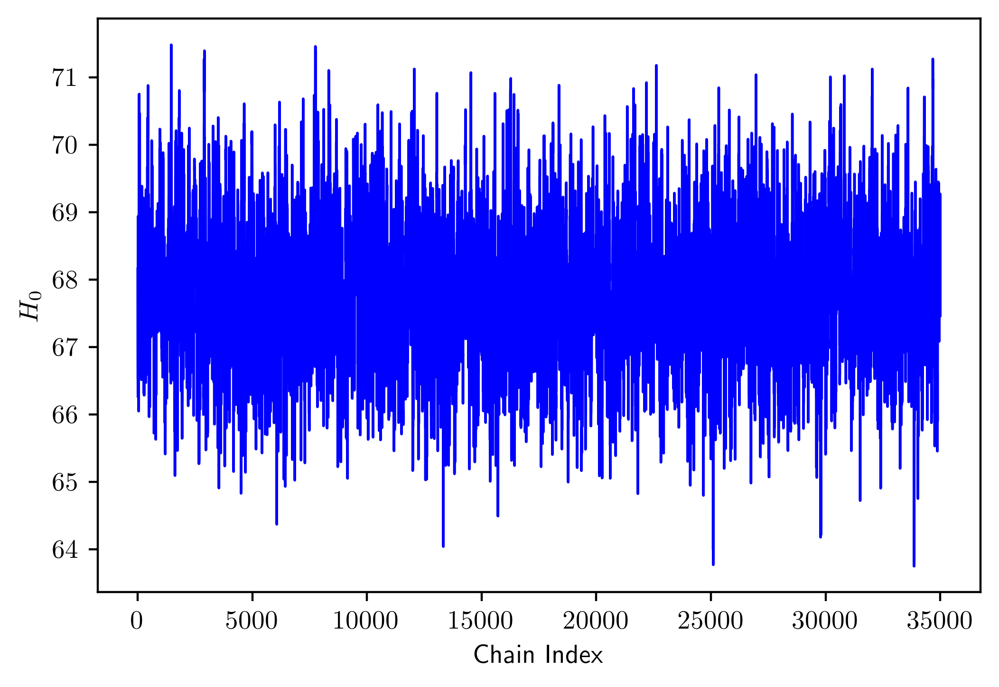

In [37]:
plt.plot(chain[:,0],color='blue',lw=1)
plt.xlabel('Chain Index')
plt.ylabel('$H_0$')

Text(0, 0.5, '$\\Omega_b h^2$')

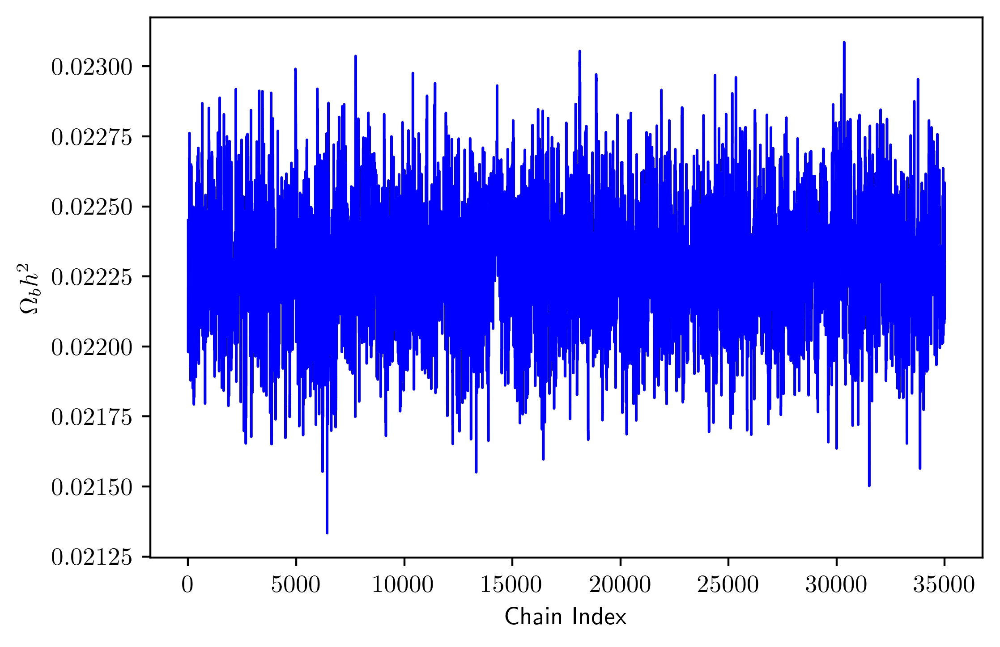

In [38]:
plt.plot(chain[:,1],color='blue',lw=1)
plt.xlabel('Chain Index')
plt.ylabel('$\Omega_b h^2$')

Text(0, 0.5, '$\\Omega_c h^2$')

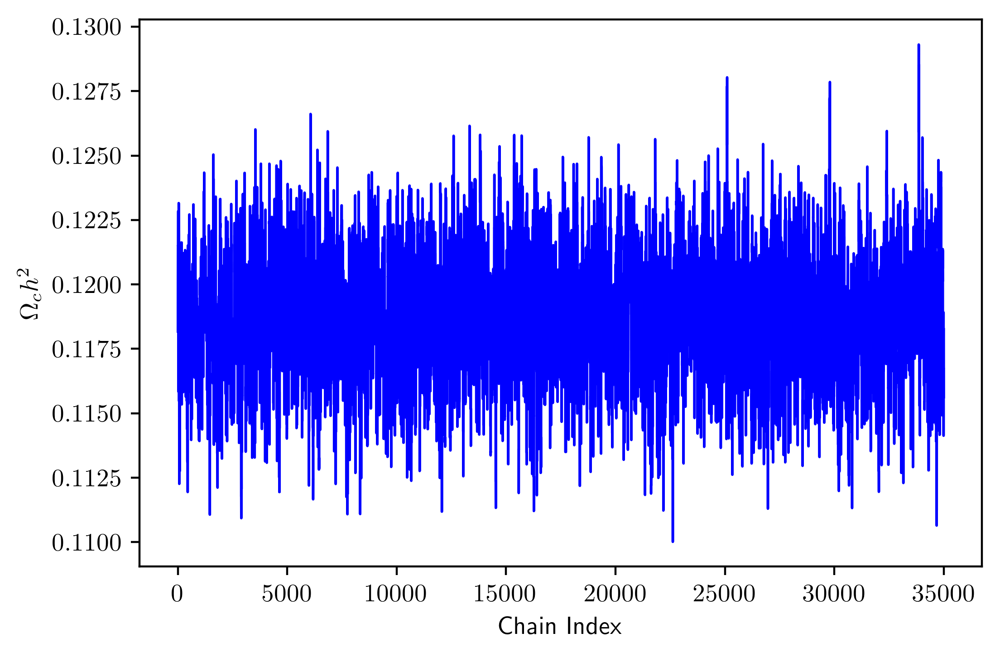

In [39]:
plt.plot(chain[:,2],color='blue',lw=1)
plt.xlabel('Chain Index')
plt.ylabel('$\Omega_c h^2$')

Text(0, 0.5, '$\\tau$')

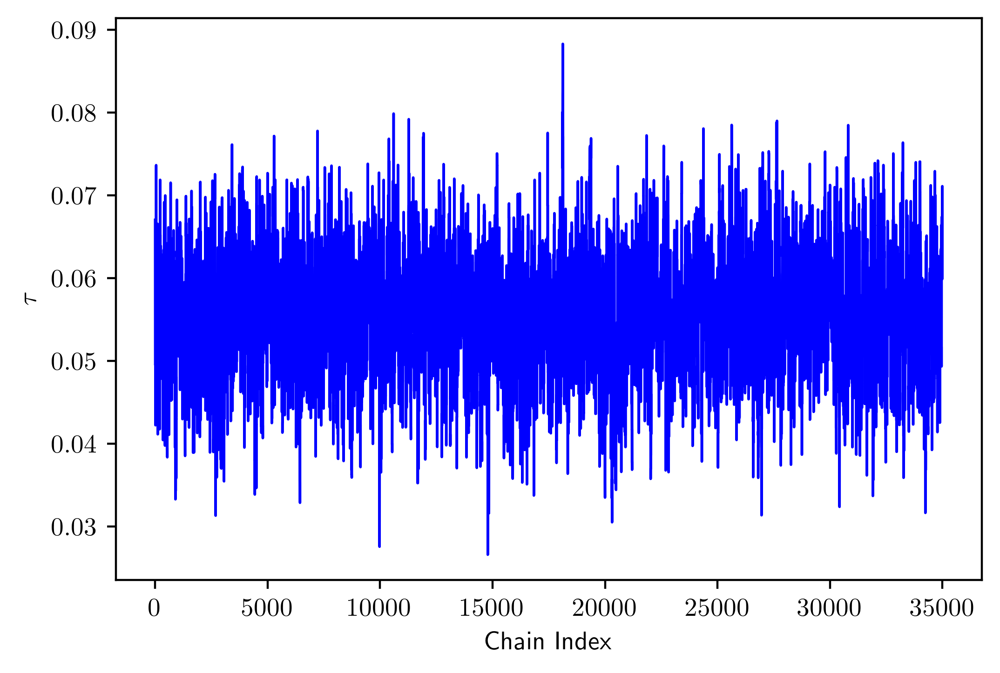

In [40]:
plt.plot(chain[:,3],color='blue',lw=1)
plt.xlabel('Chain Index')
plt.ylabel('$\\tau$')

Text(0, 0.5, '$A_s$')

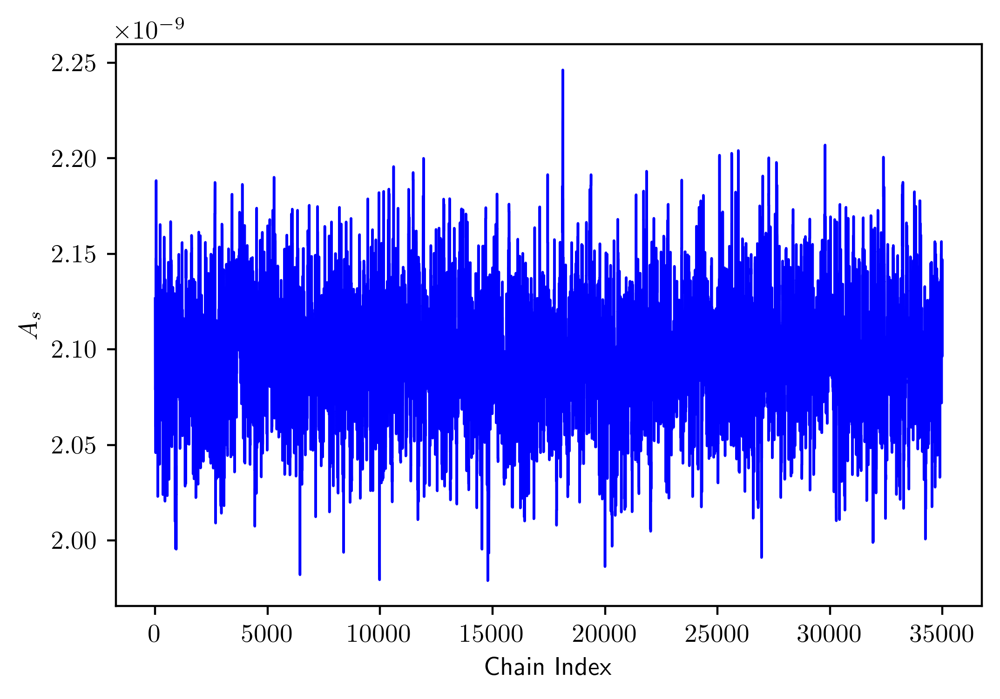

In [41]:
plt.plot(chain[:,4],color='blue',lw=1)
plt.xlabel('Chain Index')
plt.ylabel('$A_s$')

Text(0, 0.5, '$n_s$')

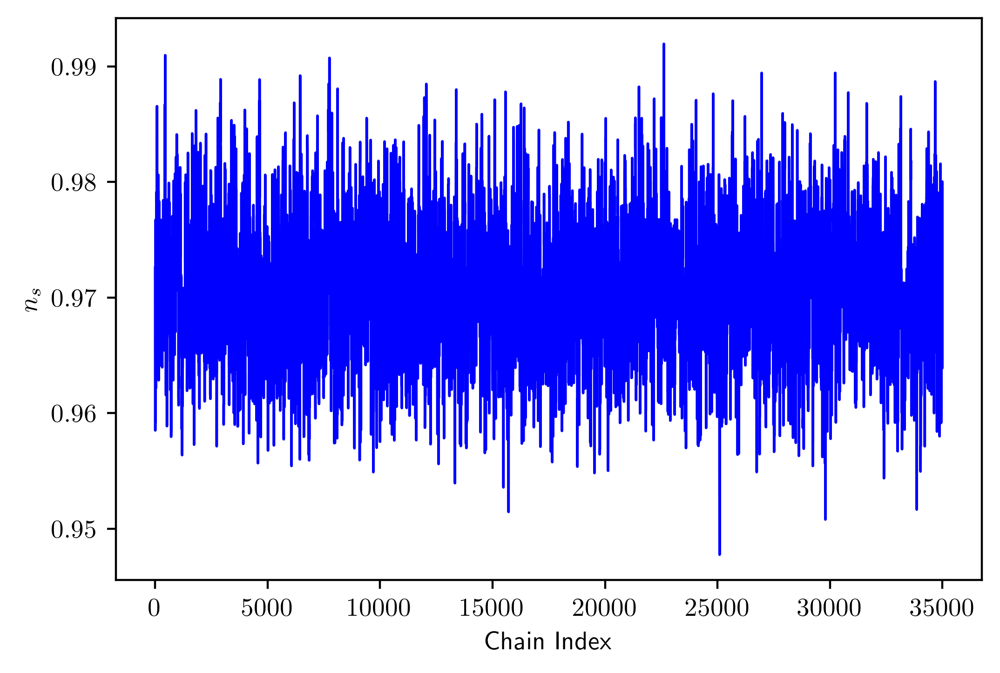

In [42]:
plt.plot(chain[:,5],color='blue',lw=1)
plt.xlabel('Chain Index')
plt.ylabel('$n_s$')

The convergence is better than on the previous chain. Again I make a corner plot with all 6 parameters

<Figure size 1200x800 with 0 Axes>

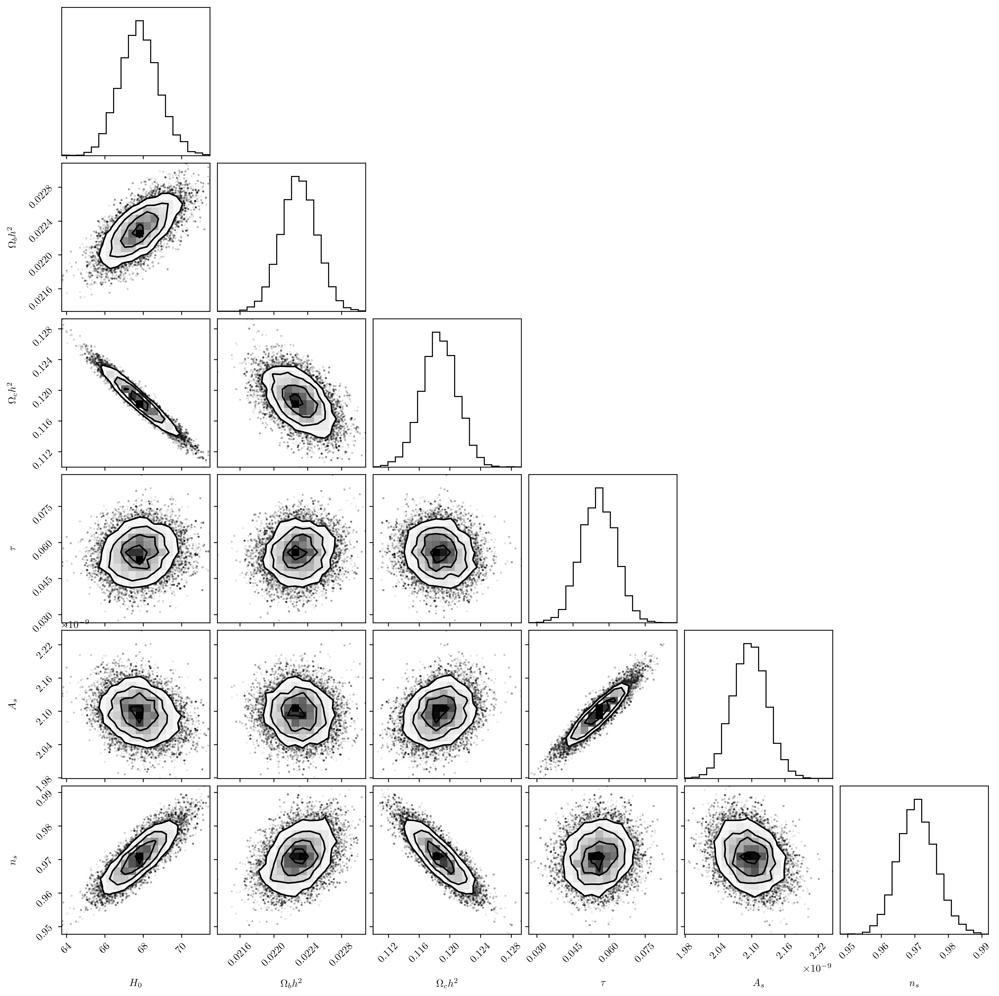

In [43]:
plt.clf()
fig = corner.corner(chain,color='black',
             labels=['$H_0$',
                     '$\Omega_b h^2$',
                     '$\Omega_c h^2$',
                     '$\\tau$',
                     '$A_s$',
                     '$n_s$'])

Now we calculate the parameters and uncertainties using the chain.

In [44]:
H_0 = np.mean(chain[:,0])
e_H_0 = np.std(chain[:,0])
print(H_0,e_H_0)

Omega_b = np.mean(chain[:,1])
e_Omega_b = np.std(chain[:,1])
print(Omega_b,e_Omega_b)

Omega_c = np.mean(chain[:,2])
e_Omega_c = np.std(chain[:,2])
print(Omega_c,e_Omega_c)

tau = np.mean(chain[:,3])
e_tau = np.std(chain[:,3])
print(tau,e_tau)

A_s = np.mean(chain[:,4])
e_A_s = np.std(chain[:,4])
print(A_s,e_A_s)

n_s = np.mean(chain[:,5])
e_n_s = np.std(chain[:,5])
print(n_s,e_n_s)

67.807591119819 1.0267953243065362
0.022297654680344857 0.00021295016550971585
0.11864605852553683 0.0023243145081651285
0.05560194667020127 0.007214735630056326
2.0964245125371587e-09 3.140283356966555e-11
0.970770059451648 0.005595608874587194


So the parameters and uncertainties we got are
\begin{align}
    H_0 &= (68\pm1)\text{x}10^1\\
    \Omega_bh^2 &=(2.22\pm0.02)\text{x}10^{-2}\\
    \Omega_ch^2 &=(1.12\pm0.02)\text{x}10^{-1}\\ 
    \tau &= (5.6\pm0.7)\text{x}10^{-2}\\
    A_s &= (2.10\pm0.03)\text{x}10^{-9}\\
    n_s &= (9.71\pm0.06)\text{x}10^{-1}
\end{align}
These parameters are all in agreement with what we got from importance sampling